# Restauration virtuelle de paysages pour la conservation

**Construction du domaine B (images naturelles saines)**

In [1]:
import os, glob, shutil, random
import cv2
import numpy as np
from tqdm import tqdm

# =========================
# 1) Trouver automatiquement les images dans /kaggle/input
# =========================
INPUT_ROOT = "/kaggle/input"
datasets = os.listdir(INPUT_ROOT)
print("Datasets disponibles:", datasets)


DATASET_NAME = datasets[0]
DATASET_PATH = os.path.join(INPUT_ROOT, DATASET_NAME)
print("Dataset utilisé:", DATASET_NAME)

# chercher toutes les images récursivement
img_paths = []
for ext in ("*.jpg","*.jpeg","*.png","*.webp","*.bmp"):
    img_paths += glob.glob(os.path.join(DATASET_PATH, "**", ext), recursive=True)

print("Total images trouvées:", len(img_paths))
assert len(img_paths) > 0, " Aucune image trouvée"

# =========================
# 2) Créer le dossier B_healthy_filtered
# =========================
ROOT = "/kaggle/working/project"
B_FILT = f"{ROOT}/data/B_healthy_filtered"

shutil.rmtree(B_FILT, ignore_errors=True)
os.makedirs(B_FILT, exist_ok=True)

# =========================
# 3) Fonction de filtrage (paysage naturel)
# =========================
def keep_landscape(img):
    img = cv2.resize(img, (256,256))

    # variété globale (élimine textures / dessins)
    if img.std() < 20:
        return False

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(gray, 80, 160)
    if edges.mean()/255 < 0.02:
        return False

    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    H,S,V = hsv[...,0], hsv[...,1], hsv[...,2]

    green = ((H>=35)&(H<=85)&(S>40)&(V>40)).mean()
    blue  = ((H>=90)&(H<=135)&(S>30)&(V>40)).mean()

    if (green + blue) < 0.08:
        return False

    return True

# =========================
# 4) Filtrage + copie
# =========================
TARGET_N = 3000
random.shuffle(img_paths)

kept = 0
for p in tqdm(img_paths, desc="Création B_healthy_filtered"):
    img = cv2.imread(p)
    if img is None:
        continue

    if keep_landscape(img):
        name = f"{kept:06d}.jpg"
        cv2.imwrite(os.path.join(B_FILT, name), img)
        kept += 1
        if kept >= TARGET_N:
            break

print("✅ B_healthy_filtered créé avec", kept, "images")
print("📁 Dossier:", B_FILT)

Datasets disponibles: ['datasets']
Dataset utilisé: datasets
Total images trouvées: 90000


Création B_healthy_filtered:   5%|▍         | 4168/90000 [01:28<30:18, 47.19it/s]

✅ B_healthy_filtered créé avec 3000 images
📁 Dossier: /kaggle/working/project/data/B_healthy_filtered


**Vérification visuelle du domaine B filtré**

Images filtrées: 3000


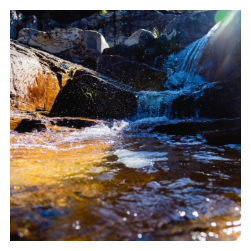

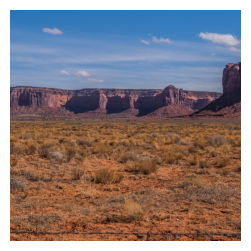

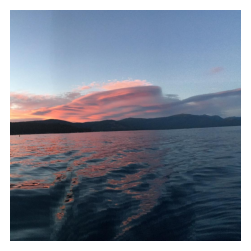

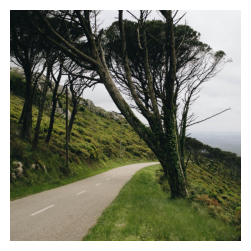

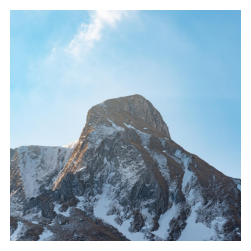

...

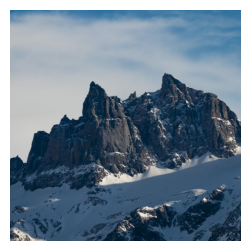

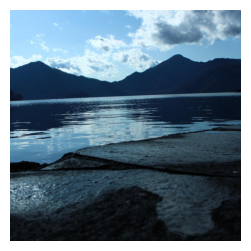

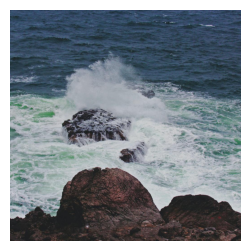

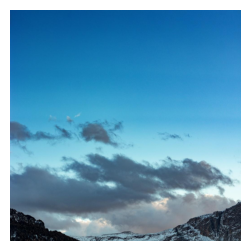

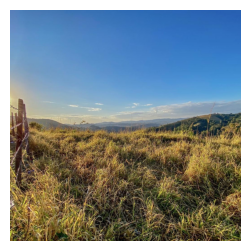

In [2]:
import glob, random
import matplotlib.pyplot as plt
from PIL import Image

paths = glob.glob("/kaggle/working/project/data/B_healthy_filtered/*")
print("Images filtrées:", len(paths))

for _ in range(12):
    p = random.choice(paths)
    img = Image.open(p).convert("RGB")
    plt.figure(figsize=(4,3))
    plt.imshow(img)
    plt.axis("off")
    plt.show()


**Génération synthétique des dégradations (construction du domaine A)**

In [4]:
import numpy as np, cv2

def degrade_image(img_bgr, seed=None):
    if seed is not None:
        rng = np.random.default_rng(seed)
        uniform = rng.uniform
        normal  = rng.normal   # accepte size=
        rand    = rng.random
    else:
        uniform = np.random.uniform
        normal  = np.random.randn  # n'accepte pas size=
        rand    = np.random.rand

    h, w, _ = img_bgr.shape
    img = img_bgr.astype(np.float32) / 255.0

    # 1) Sécheresse : désaturation + baisse luminosité + teinte chaude
    hsv = cv2.cvtColor((img*255).astype(np.uint8), cv2.COLOR_BGR2HSV).astype(np.float32)
    hsv[...,1] *= uniform(0.25, 0.50)
    hsv[...,2] *= uniform(0.70, 0.90)
    hsv[...,0] = (hsv[...,0] + uniform(4, 12)) % 180
    base = cv2.cvtColor(np.clip(hsv,0,255).astype(np.uint8), cv2.COLOR_HSV2BGR).astype(np.float32)/255.0

    # 2) Zones brûlées
    if seed is not None:
        noise = normal(size=(h, w)).astype(np.float32)
    else:
        noise = normal(h, w).astype(np.float32)

    noise = cv2.GaussianBlur(noise, (0,0), sigmaX=uniform(0.8,1.5))
    noise = (noise-noise.min())/(noise.max()-noise.min()+1e-6)

    mask = (noise > uniform(0.55,0.75)).astype(np.float32)
    mask = cv2.GaussianBlur(mask, (0,0), sigmaX=uniform(1.0,2.5))[...,None]

    warm = uniform(0.25,0.45)
    dark = uniform(0.15,0.35)
    b,g,r = cv2.split(base)
    warm_base = cv2.merge([
        np.clip(b-warm*0.25,0,1),
        np.clip(g-warm*0.10,0,1),
        np.clip(r+warm*0.20,0,1)
    ])
    burned = base*(1-mask) + warm_base*mask
    burned = np.clip(burned*(1-dark*mask),0,1)

    # 3) Fumée / haze
    air = np.array([0.80,0.80,0.80], dtype=np.float32)
    haze = uniform(0.20,0.45)
    haze_map = haze*(0.7+0.3*rand(h,w))[...,None]
    out = burned*(1-haze_map) + air*haze_map

    # 4) Poussière fine (grain)
    if seed is not None:
        dust = normal(size=(h,w,1)).astype(np.float32)
    else:
        dust = normal(h,w,1).astype(np.float32)

    out = np.clip(out + dust * uniform(0.01,0.03), 0, 1)

    return (out*255).astype(np.uint8)


**Génération du domaine A à partir du domaine B**

In [5]:
import os, glob, shutil
import cv2
from tqdm import tqdm

ROOT = "/kaggle/working/project"
B_FILT = f"{ROOT}/data/B_healthy_filtered"
A_DIR  = f"{ROOT}/data/A_degraded"

# reset A_degraded
shutil.rmtree(A_DIR, ignore_errors=True)
os.makedirs(A_DIR, exist_ok=True)

IMG_SIZE = 256  # garde 128 pour vitesse (tu peux mettre 256 plus tard)

B_paths = sorted(glob.glob(B_FILT + "/*"))
assert len(B_paths) > 0, "❌ B_healthy_filtered vide"

for p in tqdm(B_paths, desc="Generating A_degraded"):
    img = cv2.imread(p)
    if img is None:
        continue
    img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
    out = degrade_image(img)
    cv2.imwrite(os.path.join(A_DIR, os.path.basename(p)), out)

print("✅ B_filtered:", len(B_paths))
print("✅ A_degraded:", len(glob.glob(A_DIR + "/*")))
print("Folder A:", A_DIR)


Generating A_degraded: 100%|██████████| 3000/3000 [00:57<00:00, 52.28it/s]

✅ B_filtered: 3000
✅ A_degraded: 3000
Folder A: /kaggle/working/project/data/A_degraded


**Comparaison visuelle entre domaines A (dégradé) et B (sain)**

A: 3000 B: 3000


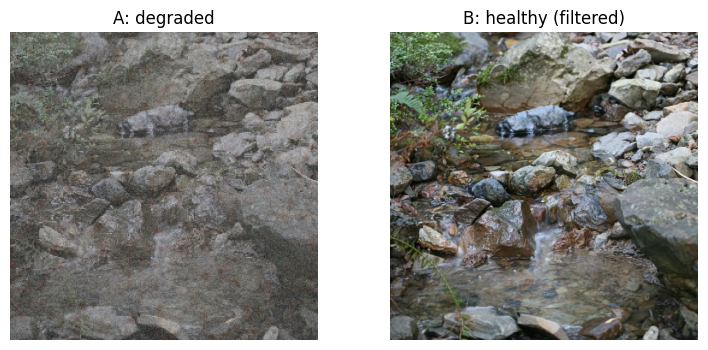

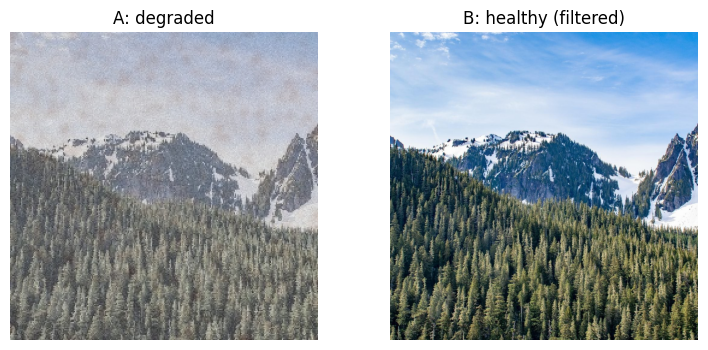

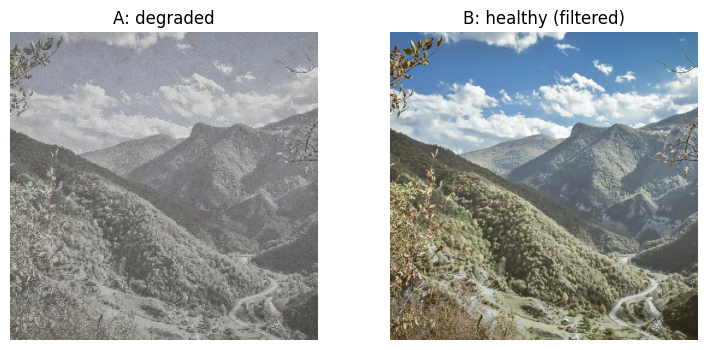

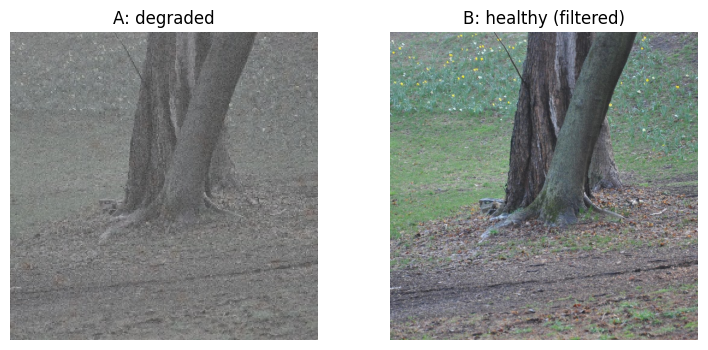

In [6]:
import random, os, glob
import matplotlib.pyplot as plt
from PIL import Image

A_paths = glob.glob("/kaggle/working/project/data/A_degraded/*")
B_paths = glob.glob("/kaggle/working/project/data/B_healthy_filtered/*")

print("A:", len(A_paths), "B:", len(B_paths))

for _ in range(4):
    pb = random.choice(B_paths)
    pa = os.path.join("/kaggle/working/project/data/A_degraded", os.path.basename(pb))
    if not os.path.exists(pa):
        continue

    a = Image.open(pa).convert("RGB")
    b = Image.open(pb).convert("RGB")

    plt.figure(figsize=(9,4))
    plt.subplot(1,2,1); plt.title("A: degraded"); plt.imshow(a); plt.axis("off")
    plt.subplot(1,2,2); plt.title("B: healthy (filtered)"); plt.imshow(b); plt.axis("off")
    plt.show()


**Définition du Générateur (CycleGAN : ResNet + Upsampling)**

In [9]:
import torch
import torch.nn as nn

class ResBlock(nn.Module):
    def __init__(self, c):
        super().__init__()
        self.net = nn.Sequential(
            nn.ReflectionPad2d(1),
            nn.Conv2d(c, c, 3, 1, 0, bias=False),
            nn.InstanceNorm2d(c),
            nn.ReLU(inplace=True),
            nn.ReflectionPad2d(1),
            nn.Conv2d(c, c, 3, 1, 0, bias=False),
            nn.InstanceNorm2d(c),
        )
    def forward(self, x):
        return x + self.net(x)

class UpBlock(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()
        self.net = nn.Sequential(
            nn.Upsample(scale_factor=2, mode="nearest"),
            nn.ReflectionPad2d(1),
            nn.Conv2d(in_c, out_c, 3, 1, 0, bias=False),
            nn.InstanceNorm2d(out_c),
            nn.ReLU(inplace=True),
        )
    def forward(self, x):
        return self.net(x)

class Generator(nn.Module):
    def __init__(self, in_c=3, out_c=3, base=64, n_res=9):
        super().__init__()
        self.head = nn.Sequential(
            nn.ReflectionPad2d(3),
            nn.Conv2d(in_c, base, 7, 1, 0, bias=False),
            nn.InstanceNorm2d(base),
            nn.ReLU(inplace=True),
        )
        self.down = nn.Sequential(
            nn.Conv2d(base, base*2, 3, 2, 1, bias=False),
            nn.InstanceNorm2d(base*2),
            nn.ReLU(inplace=True),
            nn.Conv2d(base*2, base*4, 3, 2, 1, bias=False),
            nn.InstanceNorm2d(base*4),
            nn.ReLU(inplace=True),
        )
        self.res = nn.Sequential(*[ResBlock(base*4) for _ in range(n_res)])
        self.up = nn.Sequential(
            UpBlock(base*4, base*2),
            UpBlock(base*2, base),
        )
        self.tail = nn.Sequential(
            nn.ReflectionPad2d(3),
            nn.Conv2d(base, out_c, 7, 1, 0),
            nn.Tanh()
        )
    def forward(self, x):
        x = self.head(x)
        x = self.down(x)
        x = self.res(x)
        x = self.up(x)
        return self.tail(x)


**Chargement des données non appariées (UnpairedDataset + DataLoader)**

In [10]:
import glob, random
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import torchvision.transforms as T

ROOT = "/kaggle/working/project"
A_DIR = f"{ROOT}/data/A_degraded"
B_DIR = f"{ROOT}/data/B_healthy_filtered"

IMG_SIZE = 256

transform = T.Compose([
    T.Resize((IMG_SIZE+30, IMG_SIZE+30)),   # un peu plus grand
    T.RandomCrop((IMG_SIZE, IMG_SIZE)),     # crop = plus de détails
    T.RandomHorizontalFlip(p=0.5),
    T.ToTensor(),
    T.Normalize((0.5,0.5,0.5),(0.5,0.5,0.5))
])

A_paths = sorted(glob.glob(A_DIR + "/*"))
B_paths = sorted(glob.glob(B_DIR + "/*"))

class UnpairedDataset(Dataset):
    def __init__(self, A_paths, B_paths, transform):
        self.A = A_paths
        self.B = B_paths
        self.t = transform

    def __len__(self):
        return max(len(self.A), len(self.B))

    def __getitem__(self, idx):
        a = Image.open(self.A[idx % len(self.A)]).convert("RGB")
        b = Image.open(self.B[random.randint(0, len(self.B)-1)]).convert("RGB")
        return self.t(a), self.t(b)

ds = UnpairedDataset(A_paths, B_paths, transform)
dl = DataLoader(ds, batch_size=1, shuffle=True, num_workers=0, pin_memory=True)

print("✅ A:", len(glob.glob(A_DIR+"/*")))
print("✅ B:", len(glob.glob(B_DIR+"/*")))
print("✅ Dataset len:", len(ds))


✅ A: 3000
✅ B: 3000
✅ Dataset len: 3000


**Définition du Discriminateur (PatchGAN)**

In [11]:
import torch
import torch.nn as nn

class Discriminator(nn.Module):
    """
    PatchGAN discriminator (CycleGAN-like).
    Input: (B,3,H,W) -> Output: (B,1,h',w')
    """
    def __init__(self, in_c=3, base=64):
        super().__init__()

        def block(in_ch, out_ch, stride, norm=True):
            layers = [nn.Conv2d(in_ch, out_ch, 4, stride, 1, bias=not norm)]
            if norm:
                layers += [nn.InstanceNorm2d(out_ch)]
            layers += [nn.LeakyReLU(0.2, inplace=True)]
            return layers

        self.net = nn.Sequential(
            *block(in_c, base, stride=2, norm=False),      # 256 -> 128
            *block(base, base*2, stride=2, norm=True),     # 128 -> 64
            *block(base*2, base*4, stride=2, norm=True),   # 64 -> 32
            *block(base*4, base*8, stride=1, norm=True),   # 32 -> 31 (approx)
            nn.Conv2d(base*8, 1, 4, 1, 1)                  # patch map
        )

    def forward(self, x):
        return self.net(x)


**Entraînement CycleGAN**

In [12]:
import os
import csv
import torch
import torch.nn as nn
import torchvision.utils as vutils
from tqdm import tqdm
import torch.nn.functional as F
from torch.cuda.amp import autocast, GradScaler

# -------------------
# Setup
# -------------------
device = "cuda" if torch.cuda.is_available() else "cpu"
OUT = "/kaggle/working/project/outputs"
os.makedirs(OUT, exist_ok=True)

G_AB = Generator(n_res=9).to(device)   # A -> B (restauration)
G_BA = Generator(n_res=9).to(device)   # B -> A (degradation)
D_A  = Discriminator().to(device)
D_B  = Discriminator().to(device)

adv = nn.MSELoss()
l1  = nn.L1Loss()

opt_G  = torch.optim.Adam(
    list(G_AB.parameters()) + list(G_BA.parameters()),
    lr=2e-4, betas=(0.5,0.999)
)
opt_DA = torch.optim.Adam(D_A.parameters(), lr=2e-4, betas=(0.5,0.999))
opt_DB = torch.optim.Adam(D_B.parameters(), lr=2e-4, betas=(0.5,0.999))

lambda_cyc  = 10.0
lambda_id   = 1.0     # moins “fade”
lambda_grad = 2.0

EPOCHS = 10
SAVE_EVERY = 800
step = 0

sch_G  = torch.optim.lr_scheduler.StepLR(opt_G,  step_size=10, gamma=0.5)
sch_DA = torch.optim.lr_scheduler.StepLR(opt_DA, step_size=10, gamma=0.5)
sch_DB = torch.optim.lr_scheduler.StepLR(opt_DB, step_size=10, gamma=0.5)

scaler = GradScaler()  # AMP

# -------------------
# Logs (CSV) pour courbes
# -------------------
LOG_CSV = f"{OUT}/losses.csv"
if not os.path.exists(LOG_CSV):
    with open(LOG_CSV, "w", newline="") as f:
        w = csv.writer(f)
        w.writerow(["step", "epoch", "loss_G", "loss_DA", "loss_DB"])

def denorm(x):
    return (x * 0.5 + 0.5).clamp(0, 1)

def grad_map(x):
    # x: (B,3,H,W) in [-1,1]
    dx = x[:, :, :, 1:] - x[:, :, :, :-1]
    dy = x[:, :, 1:, :] - x[:, :, :-1, :]
    dx = F.pad(dx, (0,1,0,0))
    dy = F.pad(dy, (0,0,0,1))
    return dx.abs() + dy.abs()

# -------------------
# Training
# -------------------
for epoch in range(EPOCHS):
    pbar = tqdm(dl, desc=f"Epoch {epoch+1}/{EPOCHS}")

    for real_A, real_B in pbar:
        real_A = real_A.to(device, non_blocking=True)
        real_B = real_B.to(device, non_blocking=True)

        # =============== Train Generators ===============
        opt_G.zero_grad(set_to_none=True)

        with autocast():
            fake_B = G_AB(real_A)
            fake_A = G_BA(real_B)

            loss_GAN = adv(D_B(fake_B), torch.ones_like(D_B(fake_B))) + \
                       adv(D_A(fake_A), torch.ones_like(D_A(fake_A)))

            rec_A = G_BA(fake_B)
            rec_B = G_AB(fake_A)
            loss_cyc = l1(rec_A, real_A) + l1(rec_B, real_B)

            id_B = G_AB(real_B)
            id_A = G_BA(real_A)
            loss_id = l1(id_B, real_B) + l1(id_A, real_A)

            loss_grad = l1(grad_map(rec_A), grad_map(real_A)) + \
                        l1(grad_map(rec_B), grad_map(real_B))

            loss_G = loss_GAN + lambda_cyc*loss_cyc + lambda_id*loss_id + lambda_grad*loss_grad

        scaler.scale(loss_G).backward()
        scaler.step(opt_G)

        # =============== Train D_A ===============
        opt_DA.zero_grad(set_to_none=True)
        with autocast():
            loss_DA = (adv(D_A(real_A), torch.ones_like(D_A(real_A))) +
                       adv(D_A(fake_A.detach()), torch.zeros_like(D_A(fake_A.detach())))) * 0.5
        scaler.scale(loss_DA).backward()
        scaler.step(opt_DA)

        # =============== Train D_B ===============
        opt_DB.zero_grad(set_to_none=True)
        with autocast():
            loss_DB = (adv(D_B(real_B), torch.ones_like(D_B(real_B))) +
                       adv(D_B(fake_B.detach()), torch.zeros_like(D_B(fake_B.detach())))) * 0.5
        scaler.scale(loss_DB).backward()
        scaler.step(opt_DB)

        scaler.update()

        # -------------------
        # Save logs (CSV) بعد كل step
        # -------------------
        with open(LOG_CSV, "a", newline="") as f:
            w = csv.writer(f)
            w.writerow([
                step, epoch,
                float(loss_G.detach().cpu()),
                float(loss_DA.detach().cpu()),
                float(loss_DB.detach().cpu())
            ])

        # --------- Save samples ---------
        if step % SAVE_EVERY == 0:
            with torch.no_grad():
                grid = torch.cat([denorm(real_A), denorm(fake_B), denorm(real_B)], dim=0)
                vutils.save_image(grid, f"{OUT}/cyclegan_step_{step}.png", nrow=1)

        # Live logs (optionnel)
        pbar.set_postfix({
            "G": float(loss_G.detach().cpu()),
            "DA": float(loss_DA.detach().cpu()),
            "DB": float(loss_DB.detach().cpu())
        })

        step += 1

    # Scheduler à la fin de CHAQUE epoch (c'est le bon endroit)
    sch_G.step()
    sch_DA.step()
    sch_DB.step()

print("✅ Training finished.")
torch.save(G_AB.state_dict(), f"{OUT}/G_AB_restoration.pth")
torch.save(G_BA.state_dict(), f"{OUT}/G_BA_degradation.pth")
print("✅ Saved checkpoints to:", OUT)
print("✅ Logs saved to:", LOG_CSV)


/tmp/ipykernel_55/734710007.py:44: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()  # AMP
Epoch 1/10:   0%|          | 0/3000 [00:00<?, ?it/s]/tmp/ipykernel_55/734710007.py:79: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
/tmp/ipykernel_55/734710007.py:104: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
/tmp/ipykernel_55/734710007.py:112: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Epoch 10/10: 100%|██████████| 3000/3000 [13:01<00:00,  3.84it/s, G=3.98, DA=0.0141, DB=0.325] 

✅ Training finished.
✅ Saved checkpoints to: /kaggle/working/project/outputs
✅ Logs saved to: /kaggle/working/project/outputs/losses.csv


**Courbes d'entraînement**

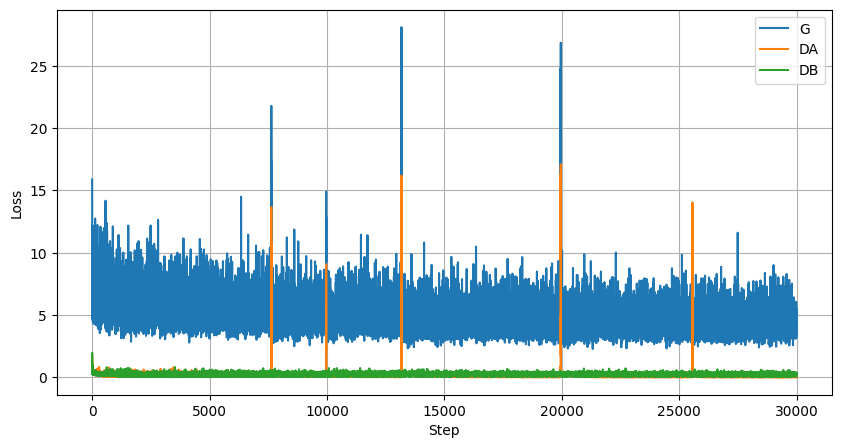

In [13]:
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv("/kaggle/working/project/outputs/losses.csv")

plt.figure(figsize=(10,5))
plt.plot(df["step"], df["loss_G"], label="G")
plt.plot(df["step"], df["loss_DA"], label="DA")
plt.plot(df["step"], df["loss_DB"], label="DB")
plt.xlabel("Step")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()


**Visualisation des sorties CycleGAN pendant l’entraînement**

Saved samples: 38


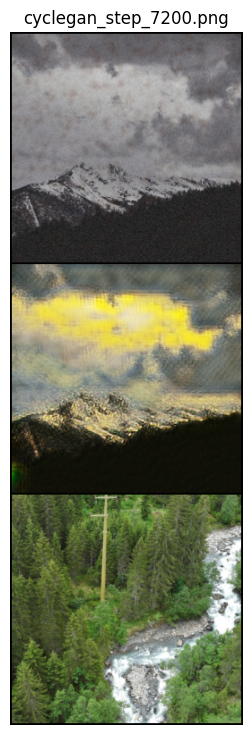

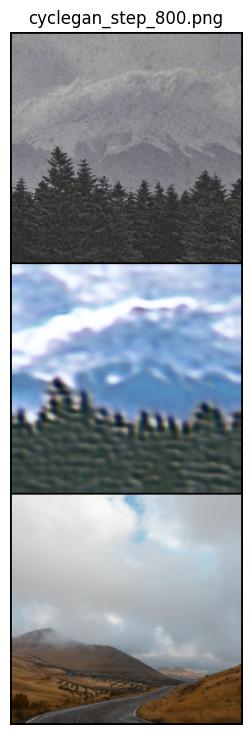

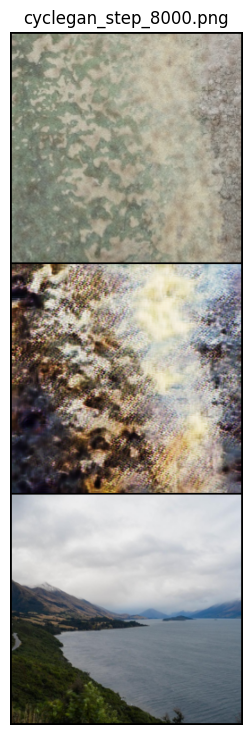

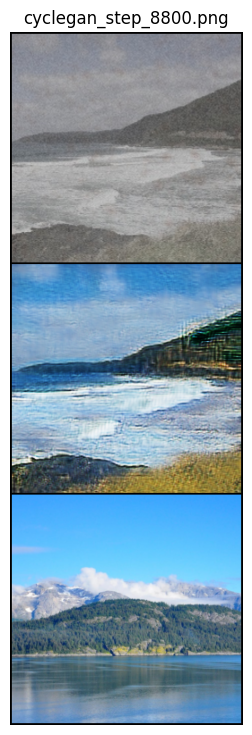

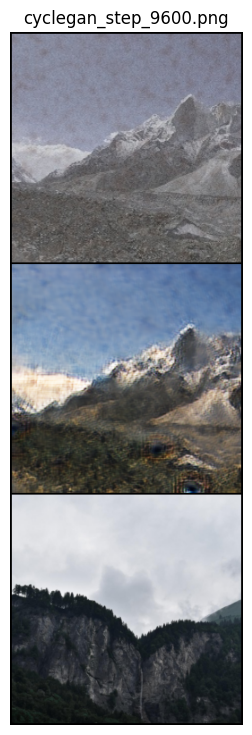

In [14]:
import glob
from PIL import Image
import matplotlib.pyplot as plt
import os

samples = sorted(glob.glob("/kaggle/working/project/outputs/cyclegan_step_*.png"))
print("Saved samples:", len(samples))

for p in samples[-5:]:
    img = Image.open(p)
    plt.figure(figsize=(4,9))
    plt.imshow(img)
    plt.axis("off")
    plt.title(os.path.basename(p))
    plt.show()


**Inférence CycleGAN (A -> B) + sauvegarde**

In [17]:
import torch
import torch.nn as nn
import torchvision.transforms as T
from PIL import Image
import os, glob
from tqdm import tqdm

# -------- paths --------
ROOT = "/kaggle/working/project"
A_DIR = f"{ROOT}/data/A_degraded"
OUT_REST = f"{ROOT}/outputs/restored_cyclegan"
CKPT = f"{ROOT}/outputs/G_AB_restoration.pth"
os.makedirs(OUT_REST, exist_ok=True)

device = "cuda" if torch.cuda.is_available() else "cpu"
print("device:", device)

# --- SAME Generator as training ---
class ResBlock(nn.Module):
    def __init__(self, c):
        super().__init__()
        self.net = nn.Sequential(
            nn.ReflectionPad2d(1),
            nn.Conv2d(c, c, 3, 1, 0, bias=False),
            nn.InstanceNorm2d(c),
            nn.ReLU(inplace=True),
            nn.ReflectionPad2d(1),
            nn.Conv2d(c, c, 3, 1, 0, bias=False),
            nn.InstanceNorm2d(c),
        )

    def forward(self, x):
        return x + self.net(x)

class UpBlock(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()
        self.net = nn.Sequential(
            nn.Upsample(scale_factor=2, mode="nearest"),
            nn.ReflectionPad2d(1),
            nn.Conv2d(in_c, out_c, 3, 1, 0, bias=False),
            nn.InstanceNorm2d(out_c),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        return self.net(x)

class Generator(nn.Module):
    def __init__(self, in_c=3, out_c=3, base=64, n_res=9):
        super().__init__()
        self.head = nn.Sequential(
            nn.ReflectionPad2d(3),
            nn.Conv2d(in_c, base, 7, 1, 0, bias=False),
            nn.InstanceNorm2d(base),
            nn.ReLU(inplace=True),
        )
        self.down = nn.Sequential(
            nn.Conv2d(base, base*2, 3, 2, 1, bias=False),
            nn.InstanceNorm2d(base*2),
            nn.ReLU(inplace=True),
            nn.Conv2d(base*2, base*4, 3, 2, 1, bias=False),
            nn.InstanceNorm2d(base*4),
            nn.ReLU(inplace=True),
        )
        self.res = nn.Sequential(*[ResBlock(base*4) for _ in range(n_res)])
        self.up = nn.Sequential(
            UpBlock(base*4, base*2),
            UpBlock(base*2, base),
        )
        self.tail = nn.Sequential(
            nn.ReflectionPad2d(3),
            nn.Conv2d(base, out_c, 7, 1, 0),
            nn.Tanh()
        )

    def forward(self, x):
        x = self.head(x)
        x = self.down(x)
        x = self.res(x)
        x = self.up(x)
        return self.tail(x)

G_AB = Generator(n_res=9).to(device)
G_AB.load_state_dict(torch.load(CKPT, map_location=device))
G_AB.eval()

IMG_SIZE = 256
tf = T.Compose([
    T.Resize((IMG_SIZE, IMG_SIZE)),
    T.ToTensor(),
    T.Normalize((0.5,0.5,0.5),(0.5,0.5,0.5))
])

def denorm(x):
    return (x * 0.5 + 0.5).clamp(0, 1)

A_paths = sorted(glob.glob(A_DIR + "/*"))
N_TEST = 200
A_paths = A_paths[:N_TEST]

with torch.no_grad():
    for p in tqdm(A_paths, desc="CycleGAN restore A->B"):
        img = Image.open(p).convert("RGB")
        x = tf(img).unsqueeze(0).to(device)
        y = G_AB(x)
        y = denorm(y)[0].cpu()
        out = T.ToPILImage()(y)
        out.save(os.path.join(OUT_REST, os.path.basename(p)))

print("✅ restored_cyclegan saved:", OUT_REST)


device: cuda


CycleGAN restore A->B: 100%|██████████| 200/200 [00:05<00:00, 34.23it/s]

✅ restored_cyclegan saved: /kaggle/working/project/outputs/restored_cyclegan


**Vérification des dossiers d’entrée/sortie pour la diffusion**

In [18]:
import os, glob

IN_DIR  = "/kaggle/working/project/outputs/restored_cyclegan"
OUT_DIR = "/kaggle/working/project/outputs/restored_diffusion_v2"

print("IN exists:", os.path.exists(IN_DIR))
print("OUT exists:", os.path.exists(OUT_DIR))

paths = sorted(glob.glob(IN_DIR + "/*"))
print("IN images:", len(paths))
print("Example:", paths[:5])


IN exists: True
OUT exists: False
IN images: 200
Example: ['/kaggle/working/project/outputs/restored_cyclegan/000000.jpg', '/kaggle/working/project/outputs/restored_cyclegan/000001.jpg', '/kaggle/working/project/outputs/restored_cyclegan/000002.jpg', '/kaggle/working/project/outputs/restored_cyclegan/000003.jpg', '/kaggle/working/project/outputs/restored_cyclegan/000004.jpg']


**Raffinement par diffusion (Stable Diffusion Img2Img)**

In [19]:
import sys
sys.path.insert(0, "/kaggle/working/pydeps")

import os, glob, torch
from PIL import Image
from tqdm import tqdm
from diffusers import StableDiffusionImg2ImgPipeline, EulerAncestralDiscreteScheduler

device = "cuda" if torch.cuda.is_available() else "cpu"
dtype  = torch.float16 if device == "cuda" else torch.float32
print("Device:", device)

ROOT = "/kaggle/working/project"
IN_DIR  = f"{ROOT}/outputs/restored_cyclegan"
OUT_DIR = f"{ROOT}/outputs/restored_diffusion"
os.makedirs(OUT_DIR, exist_ok=True)

paths = sorted(glob.glob(IN_DIR + "/*.jpg"))[:200]
print("Images to refine:", len(paths))

pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    torch_dtype=dtype,
    safety_checker=None,
).to(device)

pipe.scheduler = EulerAncestralDiscreteScheduler.from_config(pipe.scheduler.config)
pipe.set_progress_bar_config(disable=True)
pipe.enable_attention_slicing()

PROMPT = (
    "realistic natural landscape photo, sharp details, fine textures, "
    "natural colors, high clarity, DSLR photo"
)

NEG = (
    "blurry, low quality, jpeg artifacts, oversaturated, cartoon, painting, "
    "illustration, frame, border, watermark, text, deformed"
)

STRENGTH = 0.25
GUIDANCE = 5.5
STEPS    = 28

gen = torch.Generator(device=device).manual_seed(42)

with torch.inference_mode():
    for p in tqdm(paths, desc="Diffusion refinement"):
        img = Image.open(p).convert("RGB").resize((512,512), Image.LANCZOS)
        out = pipe(
            prompt=PROMPT,
            negative_prompt=NEG,
            image=img,
            strength=STRENGTH,
            num_inference_steps=STEPS,
            guidance_scale=GUIDANCE,
            generator=gen,
        ).images[0]
        out.save(os.path.join(OUT_DIR, os.path.basename(p)))

print("✅ Diffusion refinement saved in:", OUT_DIR)


2026-02-10 16:25:57.425694: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1770740757.638794      55 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1770740757.701171      55 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1770740758.226891      55 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1770740758.226930      55 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1770740758.226933      55 computation_placer.cc:177] computation placer alr

Device: cuda
Images to refine: 200


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion_img2img.StableDiffusionImg2ImgPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .
Diffusion refinement: 100%|██████████| 200/200 [05:59<00:00,  1.80s/it]

✅ Diffusion refinement saved in: /kaggle/working/project/outputs/restored_diffusion


**Comparaison visuelle A vs CycleGAN vs CycleGAN+Diffusion**

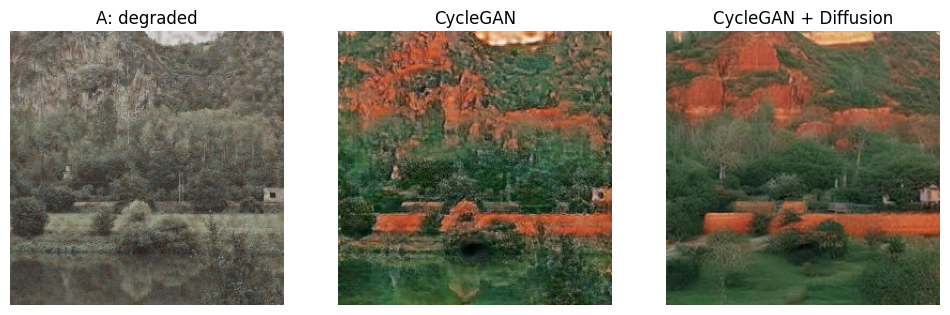

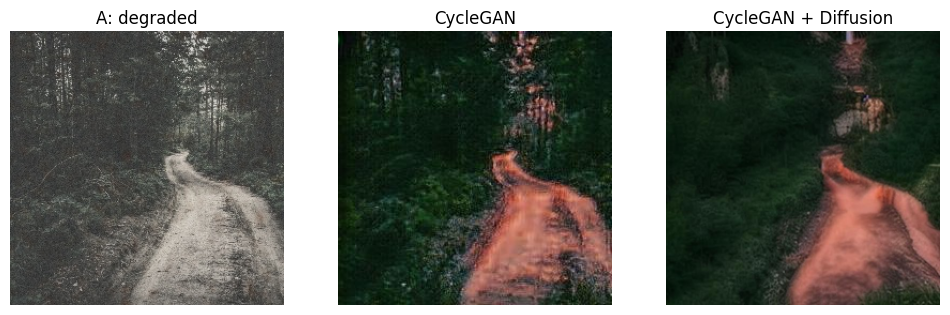

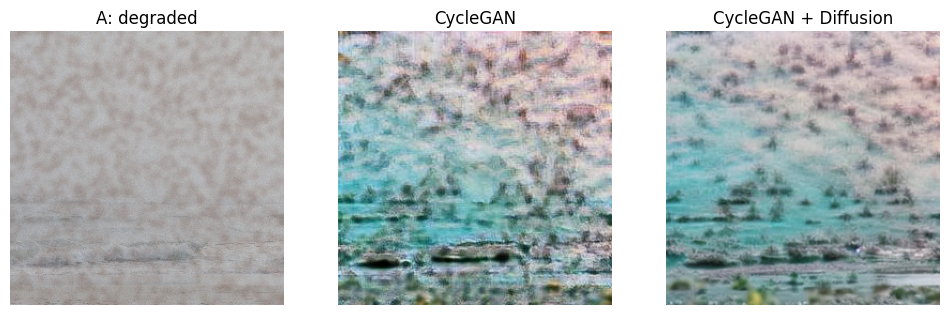

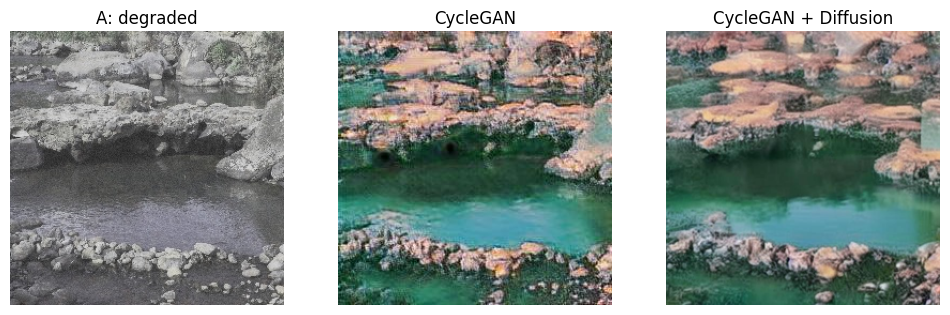

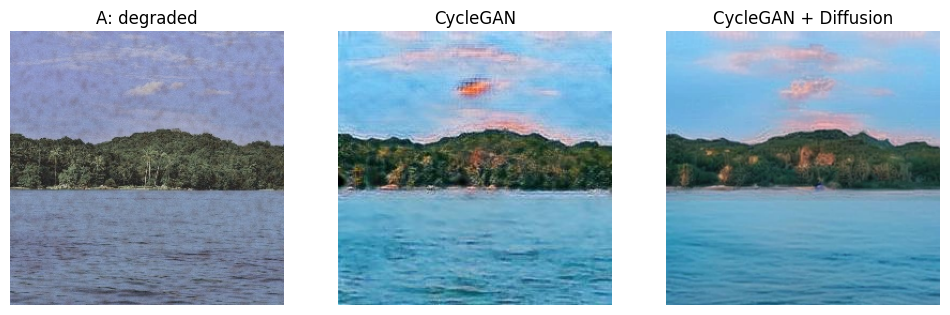

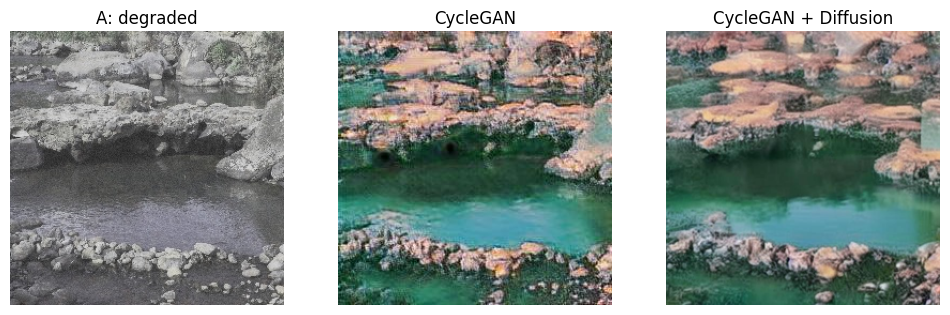

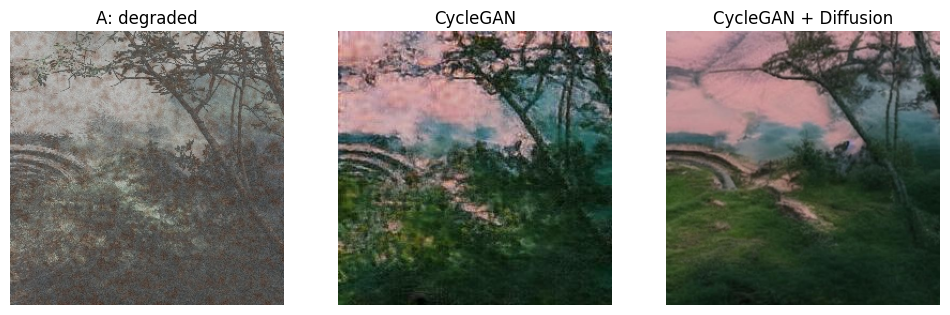

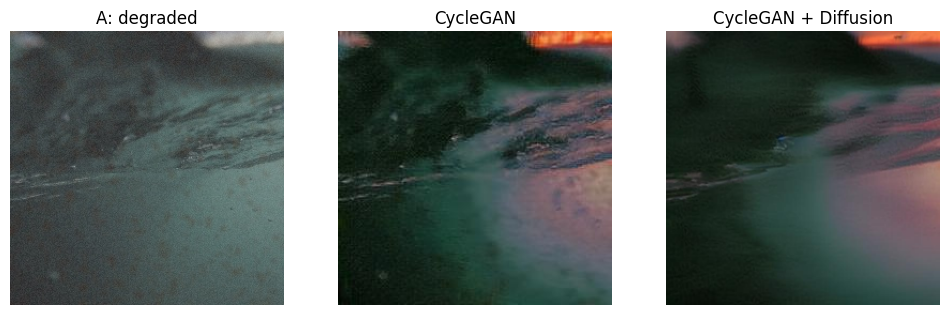

In [37]:
import random, os, glob
import matplotlib.pyplot as plt
from PIL import Image

A_DIR = "/kaggle/working/project/data/A_degraded"
CYC  = "/kaggle/working/project/outputs/restored_cyclegan"
DIF  = "/kaggle/working/project/outputs/restored_diffusion"

a_paths = sorted(glob.glob(A_DIR+"/*.jpg"))

shown = 0
for _ in range(80):
    pa = random.choice(a_paths)
    name = os.path.basename(pa)
    pc = os.path.join(CYC, name)
    pd = os.path.join(DIF, name)
    if not (os.path.exists(pc) and os.path.exists(pd)):
        continue

    A = Image.open(pa).convert("RGB").resize((256,256))
    C = Image.open(pc).convert("RGB").resize((256,256))
    D = Image.open(pd).convert("RGB").resize((256,256))

    plt.figure(figsize=(12,4))
    plt.subplot(1,3,1); plt.title("A: degraded"); plt.imshow(A); plt.axis("off")
    plt.subplot(1,3,2); plt.title("CycleGAN"); plt.imshow(C); plt.axis("off")
    plt.subplot(1,3,3); plt.title("CycleGAN + Diffusion"); plt.imshow(D); plt.axis("off")
    plt.show()

    shown += 1
    if shown == 10:
        break


**Évaluation métriques**

In [30]:
import os, glob, time
from pathlib import Path
import numpy as np
from PIL import Image

import torch
from torchmetrics.image import PeakSignalNoiseRatio, StructuralSimilarityIndexMeasure

# -------------------------
# Paths (EDIT if needed)
# -------------------------
B_DIR   = "/kaggle/working/project/data/B_healthy_filtered"
CYC_DIR = "/kaggle/working/project/outputs/restored_cyclegan"
DIF_DIR = "/kaggle/working/project/outputs/restored_diffusion"  # optional

assert os.path.isdir(B_DIR),   f"Missing: {B_DIR}"
assert os.path.isdir(CYC_DIR), f"Missing: {CYC_DIR}"

HAS_DIF = os.path.isdir(DIF_DIR)

# -------------------------
# Device
# -------------------------
device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", device)
print("HAS_DIF:", HAS_DIF)

# -------------------------
# Helpers
# -------------------------
def list_images(folder):
    exts = ("*.jpg","*.jpeg","*.png","*.webp")
    files = []
    for e in exts:
        files += glob.glob(os.path.join(folder, e))
    return sorted(files)

def load_img_tensor_01(path, size=256):
    """Return tensor [1,3,H,W] in [0,1]."""
    img = Image.open(path).convert("RGB").resize((size, size), Image.BICUBIC)
    arr = np.array(img).astype(np.float32) / 255.0
    t = torch.from_numpy(arr).permute(2,0,1).unsqueeze(0)
    return t

def sync():
    if device == "cuda":
        torch.cuda.synchronize()

# -------------------------
# Pair images (by name → fallback by order)
# -------------------------
B_files = list_images(B_DIR)
B_map = {Path(p).stem: p for p in B_files}

C_files = list_images(CYC_DIR)
pairs = [(B_map[Path(p).stem], p) for p in C_files if Path(p).stem in B_map]

if len(pairs) == 0:
    print("⚠️ No name match → order-based pairing")
    n = min(len(B_files), len(C_files))
    pairs = list(zip(B_files[:n], C_files[:n]))

pairs_dif = []
if HAS_DIF:
    D_files = list_images(DIF_DIR)
    D_map = {Path(p).stem: p for p in D_files}
    for b, c in pairs:
        k = Path(c).stem
        if k in D_map:
            pairs_dif.append((b, D_map[k]))
    if len(pairs_dif) == 0:
        n = min(len(pairs), len(D_files))
        pairs_dif = [(pairs[i][0], D_files[i]) for i in range(n)]

# -------------------------
# Metrics
# -------------------------
psnr = PeakSignalNoiseRatio(data_range=1.0).to(device)
ssim = StructuralSimilarityIndexMeasure(data_range=1.0).to(device)

# -------------------------
# Evaluation
# -------------------------
MAX_N = 200
pairs_eval = pairs[:MAX_N]
pairs_dif_eval = pairs_dif[:MAX_N] if HAS_DIF else []

def evaluate(pairs_list, size=256):
    psnr_vals, ssim_vals, times_ms = [], [], []

    with torch.no_grad():
        for b_path, x_path in pairs_list:
            b = load_img_tensor_01(b_path, size).to(device)
            x = load_img_tensor_01(x_path, size).to(device)

            # ---- metrics ----
            psnr_vals.append(psnr(x, b).item())
            ssim_vals.append(ssim(x, b).item())

            # ---- timing (metric forward only) ----
            sync()
            t0 = time.perf_counter()
            _ = psnr(x, b)
            _ = ssim(x, b)
            sync()
            t1 = time.perf_counter()
            times_ms.append((t1 - t0) * 1000.0)

    return {
        "PSNR_mean": float(np.mean(psnr_vals)),
        "PSNR_std":  float(np.std(psnr_vals)),
        "SSIM_mean": float(np.mean(ssim_vals)),
        "SSIM_std":  float(np.std(ssim_vals)),
        "Time_ms_mean": float(np.mean(times_ms)),
        "Time_ms_std":  float(np.std(times_ms)),
        "N": len(pairs_list)
    }

# -------------------------
# Results
# -------------------------
res_cyc = evaluate(pairs_eval)
print("\n✅ CycleGAN vs B_healthy")
print(res_cyc)

if HAS_DIF:
    res_dif = evaluate(pairs_dif_eval)
    print("\n✅ CycleGAN + Diffusion vs B_healthy")
    print(res_dif)
else:
    res_dif = None

# -------------------------
# Pretty table (rapport / slides)
# -------------------------
def fmeanstd(m, s, d=2): return f"{m:.{d}f} ± {s:.{d}f}"

print("\n--- TABLE ---")
print("Method | PSNR ↑ | SSIM ↑ | Time (ms) ↓ | N")
print(
    f"CycleGAN | "
    f"{fmeanstd(res_cyc['PSNR_mean'], res_cyc['PSNR_std'])} | "
    f"{fmeanstd(res_cyc['SSIM_mean'], res_cyc['SSIM_std'], 3)} | "
    f"{fmeanstd(res_cyc['Time_ms_mean'], res_cyc['Time_ms_std'])} | "
    f"{res_cyc['N']}"
)

if res_dif is not None:
    print(
        f"CycleGAN + Diffusion | "
        f"{fmeanstd(res_dif['PSNR_mean'], res_dif['PSNR_std'])} | "
        f"{fmeanstd(res_dif['SSIM_mean'], res_dif['SSIM_std'], 3)} | "
        f"{fmeanstd(res_dif['Time_ms_mean'], res_dif['Time_ms_std'])} | "
        f"{res_dif['N']}"
)


Device: cuda
HAS_DIF: True

✅ CycleGAN vs B_healthy
{'PSNR_mean': 18.967919030189513, 'PSNR_std': 2.6270841662513686, 'SSIM_mean': 0.6079884080588818, 'SSIM_std': 0.0954991301376408, 'Time_ms_mean': 2.3927459650076344, 'Time_ms_std': 0.1814056714668913, 'N': 200}

✅ CycleGAN + Diffusion vs B_healthy
{'PSNR_mean': 18.493580129146576, 'PSNR_std': 2.4803569604269233, 'SSIM_mean': 0.5728531044721603, 'SSIM_std': 0.12485162242145244, 'Time_ms_mean': 2.355367025038504, 'Time_ms_std': 0.07539793523353382, 'N': 200}

--- TABLE ---
Method | PSNR ↑ | SSIM ↑ | Time (ms) ↓ | N
CycleGAN | 18.97 ± 2.63 | 0.608 ± 0.095 | 2.39 ± 0.18 | 200
CycleGAN + Diffusion | 18.49 ± 2.48 | 0.573 ± 0.125 | 2.36 ± 0.08 | 200


In [31]:
import shutil
import os

SRC_DIR = "/kaggle/working/project/outputs"
ZIP_PATH = "/kaggle/working/outputs.zip"

# Supprimer ancien zip s'il existe
if os.path.exists(ZIP_PATH):
    os.remove(ZIP_PATH)

# Créer le zip
shutil.make_archive(
    base_name=ZIP_PATH.replace(".zip", ""),
    format="zip",
    root_dir=SRC_DIR
)

print("✅ ZIP créé :", ZIP_PATH)


✅ ZIP créé : /kaggle/working/outputs.zip


In [34]:
import shutil
import os

SRC_DIR = "/kaggle/working"
ZIP_PATH = "/kaggle/working/WORKING_ALL.zip"

# Vérification
assert os.path.isdir(SRC_DIR), f"Folder not found: {SRC_DIR}"

# Supprimer ancien zip s'il existe
if os.path.exists(ZIP_PATH):
    os.remove(ZIP_PATH)

# Créer le zip complet
shutil.make_archive(
    base_name=ZIP_PATH.replace(".zip", ""),
    format="zip",
    root_dir=SRC_DIR
)

print("✅ ZIP COMPLET créé :", ZIP_PATH)

# Aperçu rapide
print("\n📦 Contenu principal inclus :")
for name in os.listdir(SRC_DIR):
    print(" -", name)


✅ ZIP COMPLET créé : /kaggle/working/WORKING_ALL.zip

📦 Contenu principal inclus :
 - project
 - WORKING_ALL.zip
 - outputs_ALL.zip
 - .virtual_documents
 - outputs.zip
